# Delta Hes Model
Based on these equations: 

$$\frac{dH_i}{dt} = \beta_H m_{h,i}(t-T_p) - \gamma_H H_i(t)$$

$$\frac{dm_{H,i}}{dt} = \beta_m(w_H \frac{p_H^l}{p_H^l + H_i(t-T_m)^l} + w_D \frac{<D(t-T_m)>_i^n}{p_D^n + <D(t-T_m)>_i^n}) - \gamma_m m_{H,i}(t)$$

$$\frac{dD_i}{dt} = \beta_D m_{D,i}(t-T_p) - \gamma_D D_i(t)$$

$$\frac{dm_{D,i}}{dt} = \beta_m \frac{p_H^l}{p_H^l + H_i(t-T_m)^l} - \gamma_m m_{H,i}(t)$$


This gave me the following non-dimensionalised equations: 

$$\frac{d h_i}{dt} = m_{h,i}(t) - \gamma_hh_i(t)$$

$$\frac{dm_{h,i}}{dt} = w_H \frac{p_h^l}{p_h^l + h_i(t-\tau)^l} + w_D \frac{<d(t-\tau)>_i^n}{p_d^n+ <d(t-\tau)>_i^n}) - \gamma_m m_{h,i}(t)$$
    
$$\frac{d d_i}{dt} =  m_{d,i}(t) - \gamma_dd_i(t)$$

$$\frac{dm_{d,i}}{dt} = \frac{p_h^l}{p_h^l + h_i(t-\tau)^l} -\gamma_m m_{h,i}(\tau)$$


In [6]:
# import necessary packages
import numpy as np
import matplotlib.pyplot as plt
from types import SimpleNamespace
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from tqdm import tqdm
import visualisation as vis
from delta_hes_model import *

## 2D system variance for different values of coupling strength + Hill coefficient

In [13]:
# code for testing multiple coupling strengths and Hill coefficients
def test_Delta_coup(coefficient, coup_strength, lattice, num_tsteps, dt):
    print('Coefficient:', coefficient)
    print('Coupling strength:', coup_strength)
    params = get_params(gamma_h, gamma_d, gamma_m, p_h, p_d, T_h, T_coupling, w_h, coup_strength, l, coefficient, lattice, grad_hes = True, grad_coup = True, grad_hes_strength = 0.2, grad_coup_strength = 0)
    h, m_h, d, m_d = simulate(num_tsteps, dt, lattice, params, coupling_type= 'Delta', initial_type='checkerboard')
    return h, m_h, d, m_d

def test_results(results):
    std = np.std(results, axis=1)
    mean = np.mean(results, axis=1)
    
    return std, mean

num_tsteps = 10000
dt = 0.2

coefficients = [1, 2, 3, 4, 5]
coupling_strengths = [0, 0.05, 0.1, 0.2, 0.4]
results = np.zeros([5, 5, num_tsteps, lattice.P, lattice.Q])

for i in range(len(coefficients)):
    for j in range(len(coupling_strengths)):
        coeff = coefficients[i]
        coup_strength = coupling_strengths[j]
        h, m_h, d, m_d = test_Delta_coup(coeff, coup_strength, lattice, num_tsteps, dt)

        results[i, j,:,:,:] = h



Coefficient: 1
Coupling strength: 0
namespace(P=20, Q=6, w=array([[2., 3., 3., 3., 3., 2.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [2., 3., 3., 3., 3., 2.]]), connectivity=array([[0., 1., 0., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 1., 0., 1.],
       [0., 0., 0., ..., 0., 1., 0.]]))


  0%|          | 12/9999 [00:00<01:33, 106.85it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [01:35<00:00, 104.51it/s]


Coefficient: 1
Coupling strength: 0.05
namespace(P=20, Q=6, w=array([[2., 3., 3., 3., 3., 2.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [2., 3., 3., 3., 3., 2.]]), connectivity=array([[0., 1., 0., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 1., 0., 1.],
       [0., 0., 0., ..., 0., 1., 0.]]))


  0%|          | 8/9999 [00:00<02:17, 72.54it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [01:40<00:00, 99.57it/s] 


Coefficient: 1
Coupling strength: 0.1
namespace(P=20, Q=6, w=array([[2., 3., 3., 3., 3., 2.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [2., 3., 3., 3., 3., 2.]]), connectivity=array([[0., 1., 0., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 1., 0., 1.],
       [0., 0., 0., ..., 0., 1., 0.]]))


  0%|          | 11/9999 [00:00<01:31, 108.87it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [01:35<00:00, 104.74it/s]


Coefficient: 1
Coupling strength: 0.2
namespace(P=20, Q=6, w=array([[2., 3., 3., 3., 3., 2.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [2., 3., 3., 3., 3., 2.]]), connectivity=array([[0., 1., 0., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 1., 0., 1.],
       [0., 0., 0., ..., 0., 1., 0.]]))


  0%|          | 6/9999 [00:00<03:02, 54.74it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [01:39<00:00, 100.14it/s]


Coefficient: 1
Coupling strength: 0.4
namespace(P=20, Q=6, w=array([[2., 3., 3., 3., 3., 2.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [2., 3., 3., 3., 3., 2.]]), connectivity=array([[0., 1., 0., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 1., 0., 1.],
       [0., 0., 0., ..., 0., 1., 0.]]))


  0%|          | 9/9999 [00:00<01:58, 83.99it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [01:37<00:00, 102.68it/s]


Coefficient: 2
Coupling strength: 0
namespace(P=20, Q=6, w=array([[2., 3., 3., 3., 3., 2.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [2., 3., 3., 3., 3., 2.]]), connectivity=array([[0., 1., 0., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 1., 0., 1.],
       [0., 0., 0., ..., 0., 1., 0.]]))


  0%|          | 14/9999 [00:00<01:14, 133.50it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [01:21<00:00, 122.63it/s]


Coefficient: 2
Coupling strength: 0.05
namespace(P=20, Q=6, w=array([[2., 3., 3., 3., 3., 2.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [2., 3., 3., 3., 3., 2.]]), connectivity=array([[0., 1., 0., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 1., 0., 1.],
       [0., 0., 0., ..., 0., 1., 0.]]))


  0%|          | 13/9999 [00:00<01:20, 123.44it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [01:17<00:00, 128.29it/s]


Coefficient: 2
Coupling strength: 0.1
namespace(P=20, Q=6, w=array([[2., 3., 3., 3., 3., 2.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [2., 3., 3., 3., 3., 2.]]), connectivity=array([[0., 1., 0., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 1., 0., 1.],
       [0., 0., 0., ..., 0., 1., 0.]]))


  0%|          | 15/9999 [00:00<01:10, 141.45it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [01:23<00:00, 120.38it/s]


Coefficient: 2
Coupling strength: 0.2
namespace(P=20, Q=6, w=array([[2., 3., 3., 3., 3., 2.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [2., 3., 3., 3., 3., 2.]]), connectivity=array([[0., 1., 0., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 1., 0., 1.],
       [0., 0., 0., ..., 0., 1., 0.]]))


  0%|          | 10/9999 [00:00<01:40, 99.79it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [01:33<00:00, 106.42it/s]


Coefficient: 2
Coupling strength: 0.4
namespace(P=20, Q=6, w=array([[2., 3., 3., 3., 3., 2.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [2., 3., 3., 3., 3., 2.]]), connectivity=array([[0., 1., 0., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 1., 0., 1.],
       [0., 0., 0., ..., 0., 1., 0.]]))


  0%|          | 11/9999 [00:00<01:31, 109.76it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [01:37<00:00, 102.35it/s]


Coefficient: 3
Coupling strength: 0
namespace(P=20, Q=6, w=array([[2., 3., 3., 3., 3., 2.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [2., 3., 3., 3., 3., 2.]]), connectivity=array([[0., 1., 0., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 1., 0., 1.],
       [0., 0., 0., ..., 0., 1., 0.]]))


  0%|          | 10/9999 [00:00<02:01, 82.55it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [01:21<00:00, 122.94it/s]


Coefficient: 3
Coupling strength: 0.05
namespace(P=20, Q=6, w=array([[2., 3., 3., 3., 3., 2.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [2., 3., 3., 3., 3., 2.]]), connectivity=array([[0., 1., 0., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 1., 0., 1.],
       [0., 0., 0., ..., 0., 1., 0.]]))


  0%|          | 11/9999 [00:00<01:31, 109.35it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [01:14<00:00, 134.29it/s]


Coefficient: 3
Coupling strength: 0.1
namespace(P=20, Q=6, w=array([[2., 3., 3., 3., 3., 2.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [2., 3., 3., 3., 3., 2.]]), connectivity=array([[0., 1., 0., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 1., 0., 1.],
       [0., 0., 0., ..., 0., 1., 0.]]))


  0%|          | 7/9999 [00:00<02:24, 69.36it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [01:19<00:00, 125.92it/s]


Coefficient: 3
Coupling strength: 0.2
namespace(P=20, Q=6, w=array([[2., 3., 3., 3., 3., 2.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [2., 3., 3., 3., 3., 2.]]), connectivity=array([[0., 1., 0., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 1., 0., 1.],
       [0., 0., 0., ..., 0., 1., 0.]]))


  0%|          | 12/9999 [00:00<01:24, 118.86it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [01:34<00:00, 106.03it/s]


Coefficient: 3
Coupling strength: 0.4
namespace(P=20, Q=6, w=array([[2., 3., 3., 3., 3., 2.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [2., 3., 3., 3., 3., 2.]]), connectivity=array([[0., 1., 0., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 1., 0., 1.],
       [0., 0., 0., ..., 0., 1., 0.]]))


  0%|          | 6/9999 [00:00<02:47, 59.52it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [01:28<00:00, 112.84it/s]


Coefficient: 4
Coupling strength: 0
namespace(P=20, Q=6, w=array([[2., 3., 3., 3., 3., 2.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [2., 3., 3., 3., 3., 2.]]), connectivity=array([[0., 1., 0., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 1., 0., 1.],
       [0., 0., 0., ..., 0., 1., 0.]]))


  0%|          | 10/9999 [00:00<01:44, 95.95it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [01:15<00:00, 132.66it/s]


Coefficient: 4
Coupling strength: 0.05
namespace(P=20, Q=6, w=array([[2., 3., 3., 3., 3., 2.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [2., 3., 3., 3., 3., 2.]]), connectivity=array([[0., 1., 0., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 1., 0., 1.],
       [0., 0., 0., ..., 0., 1., 0.]]))


  0%|          | 11/9999 [00:00<01:31, 109.18it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [01:15<00:00, 132.30it/s]


Coefficient: 4
Coupling strength: 0.1
namespace(P=20, Q=6, w=array([[2., 3., 3., 3., 3., 2.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [2., 3., 3., 3., 3., 2.]]), connectivity=array([[0., 1., 0., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 1., 0., 1.],
       [0., 0., 0., ..., 0., 1., 0.]]))


  0%|          | 12/9999 [00:00<01:27, 113.58it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [01:23<00:00, 119.63it/s]


Coefficient: 4
Coupling strength: 0.2
namespace(P=20, Q=6, w=array([[2., 3., 3., 3., 3., 2.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [2., 3., 3., 3., 3., 2.]]), connectivity=array([[0., 1., 0., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 1., 0., 1.],
       [0., 0., 0., ..., 0., 1., 0.]]))


  0%|          | 9/9999 [00:00<01:59, 83.80it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [01:39<00:00, 100.96it/s]


Coefficient: 4
Coupling strength: 0.4
namespace(P=20, Q=6, w=array([[2., 3., 3., 3., 3., 2.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [2., 3., 3., 3., 3., 2.]]), connectivity=array([[0., 1., 0., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 1., 0., 1.],
       [0., 0., 0., ..., 0., 1., 0.]]))


  0%|          | 8/9999 [00:00<02:06, 78.81it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [01:26<00:00, 115.35it/s]


Coefficient: 5
Coupling strength: 0
namespace(P=20, Q=6, w=array([[2., 3., 3., 3., 3., 2.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [2., 3., 3., 3., 3., 2.]]), connectivity=array([[0., 1., 0., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 1., 0., 1.],
       [0., 0., 0., ..., 0., 1., 0.]]))


  0%|          | 8/9999 [00:00<02:12, 75.65it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [01:39<00:00, 100.25it/s]


Coefficient: 5
Coupling strength: 0.05
namespace(P=20, Q=6, w=array([[2., 3., 3., 3., 3., 2.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [2., 3., 3., 3., 3., 2.]]), connectivity=array([[0., 1., 0., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 1., 0., 1.],
       [0., 0., 0., ..., 0., 1., 0.]]))


  0%|          | 7/9999 [00:00<02:24, 69.18it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [01:39<00:00, 100.37it/s]


Coefficient: 5
Coupling strength: 0.1
namespace(P=20, Q=6, w=array([[2., 3., 3., 3., 3., 2.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [2., 3., 3., 3., 3., 2.]]), connectivity=array([[0., 1., 0., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 1., 0., 1.],
       [0., 0., 0., ..., 0., 1., 0.]]))


  0%|          | 8/9999 [00:00<02:17, 72.53it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [01:28<00:00, 112.46it/s]


Coefficient: 5
Coupling strength: 0.2
namespace(P=20, Q=6, w=array([[2., 3., 3., 3., 3., 2.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [2., 3., 3., 3., 3., 2.]]), connectivity=array([[0., 1., 0., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 1., 0., 1.],
       [0., 0., 0., ..., 0., 1., 0.]]))


  0%|          | 8/9999 [00:00<02:07, 78.62it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [01:42<00:00, 97.23it/s] 


Coefficient: 5
Coupling strength: 0.4
namespace(P=20, Q=6, w=array([[2., 3., 3., 3., 3., 2.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [3., 4., 4., 4., 4., 3.],
       [2., 3., 3., 3., 3., 2.]]), connectivity=array([[0., 1., 0., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 1., 0., 1.],
       [0., 0., 0., ..., 0., 1., 0.]]))


  0%|          | 9/9999 [00:00<02:01, 82.12it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [01:39<00:00, 100.62it/s]


### Save to file

In [14]:
# save the results to a file\
import pickle

data = results

with open("results_delta_std_15_04.pkl", "wb") as file:
    pickle.dump(data, file)

### Plot for each P value

C:\Users\kbmcd\AppData\Local\Temp\ipykernel_20300\1729508833.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


<Figure size 640x480 with 0 Axes>

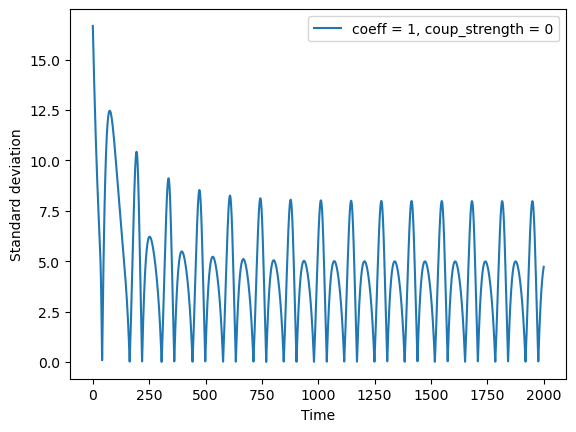

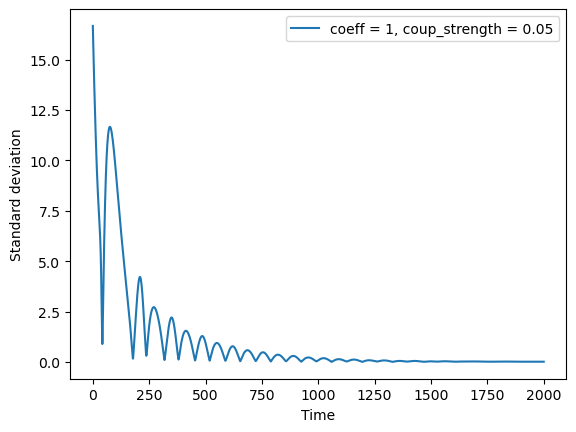

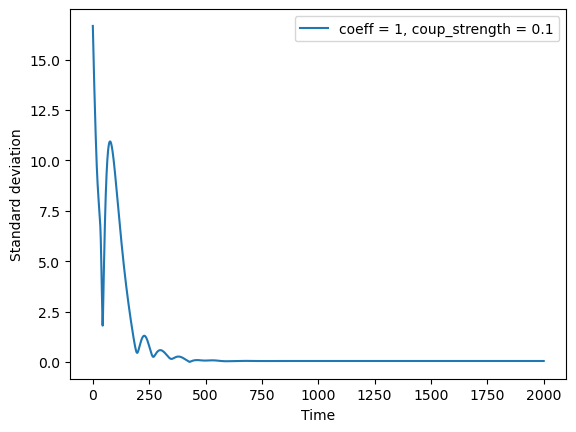

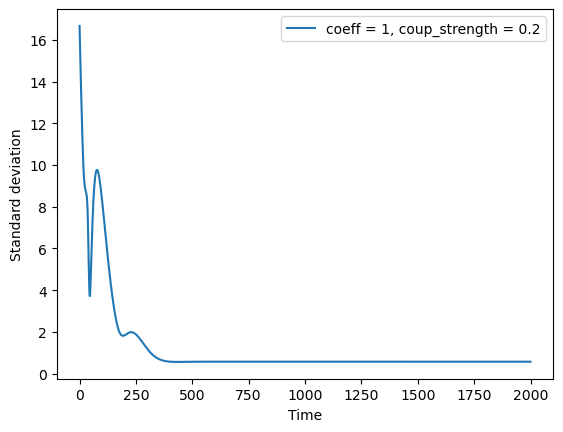

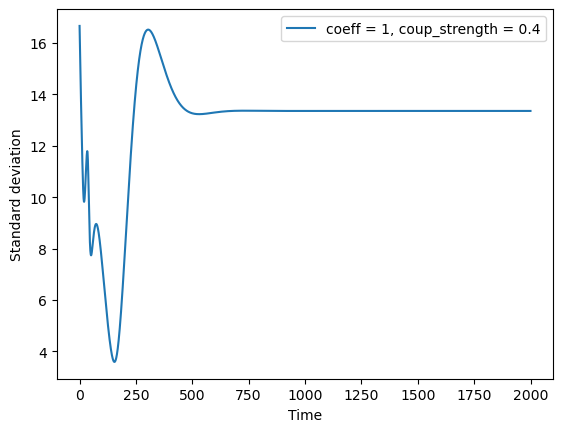

...

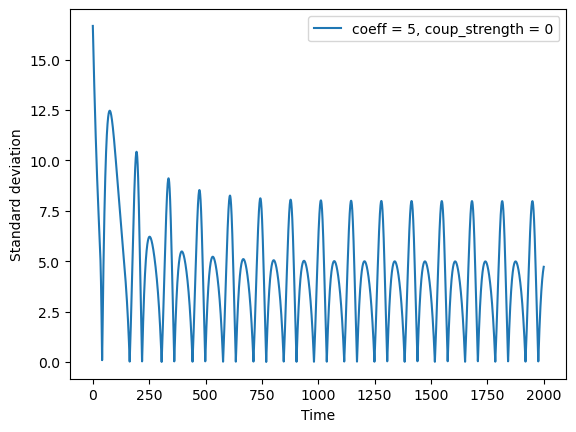

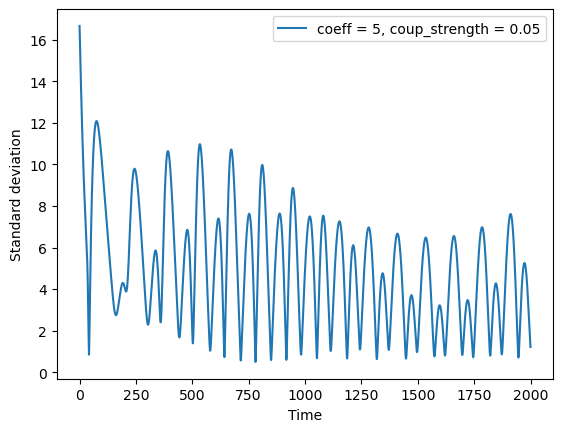

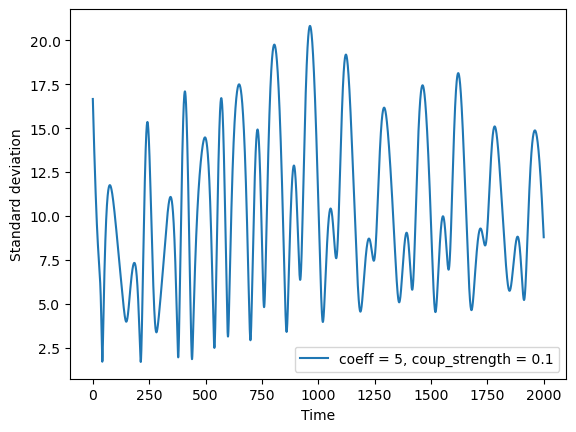

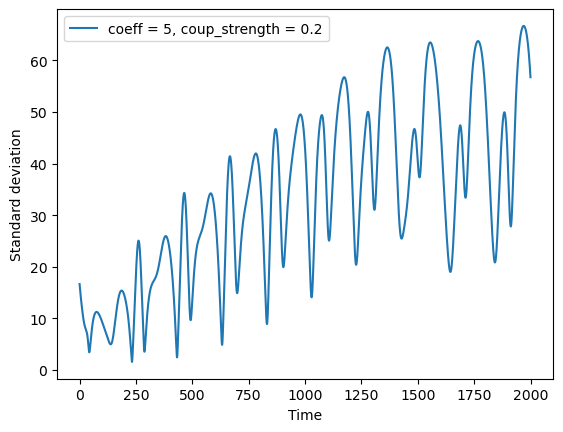

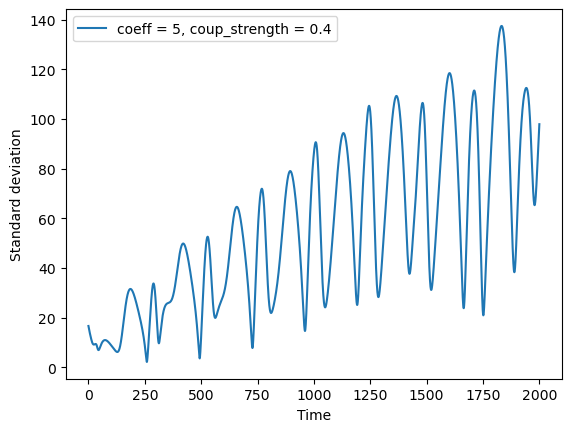

In [15]:
P_of_interest = 10

standard_deviation = np.zeros([len(coefficients), len(coupling_strengths), num_tsteps])
mean = np.zeros([len(coefficients), len(coupling_strengths), num_tsteps])

plt.figure()
for i in range(len(coefficients)):
    for j in range(len(coupling_strengths)):
        values = results[i, j, :, :, :]
        for k in range(num_tsteps):
            standard_deviation[i,j,k] = np.std(values[k, P_of_interest, :])
            mean[i,j] = np.mean(values[k, P_of_interest, :])
        plt.figure()
        plt.plot(np.arange(num_tsteps)*dt, standard_deviation[i,j], label = f'coeff = {coefficients[i]}, coup_strength = {coupling_strengths[j]}')
        plt.xlabel('Time')
        plt.ylabel('Standard deviation')
        plt.legend()


        

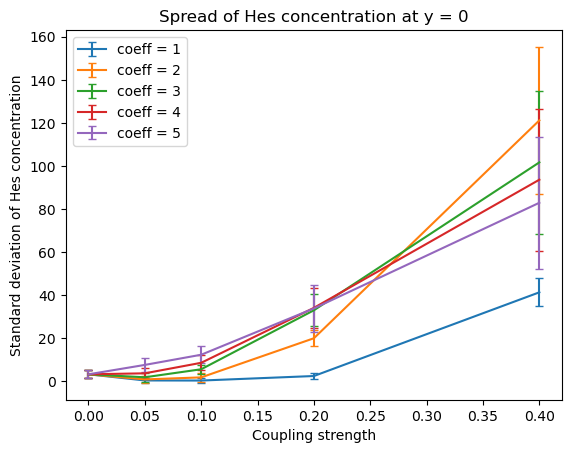

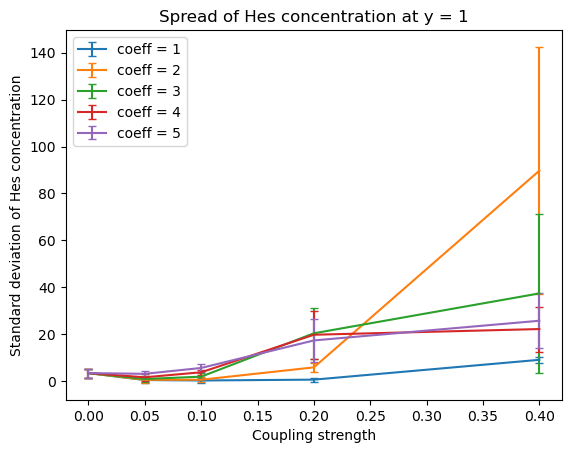

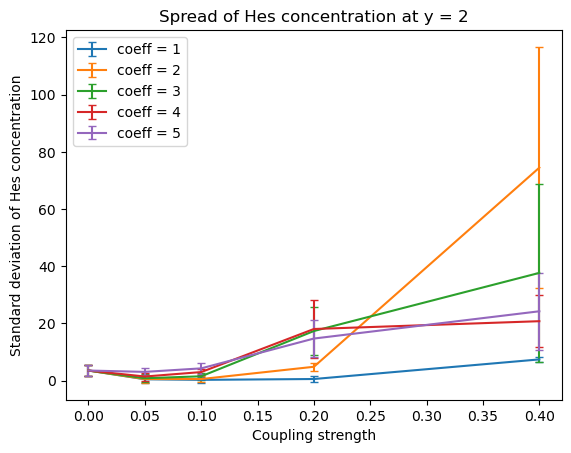

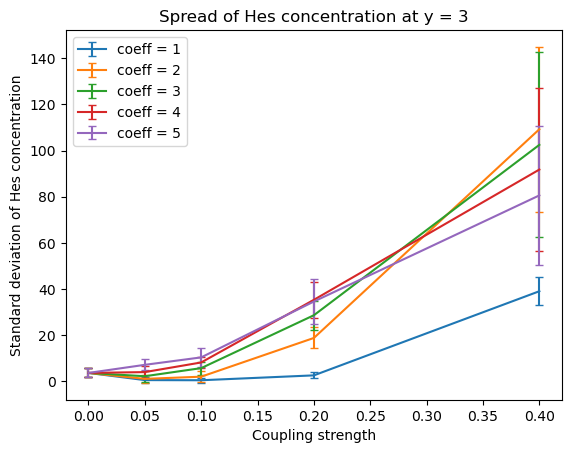

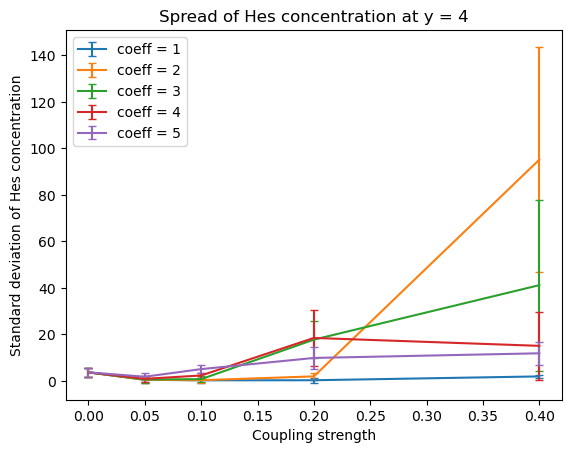

...

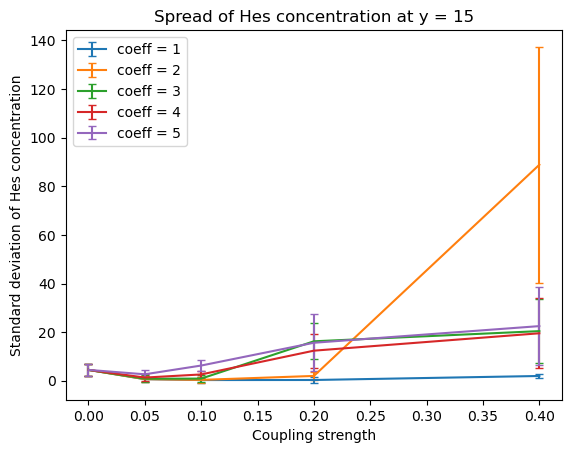

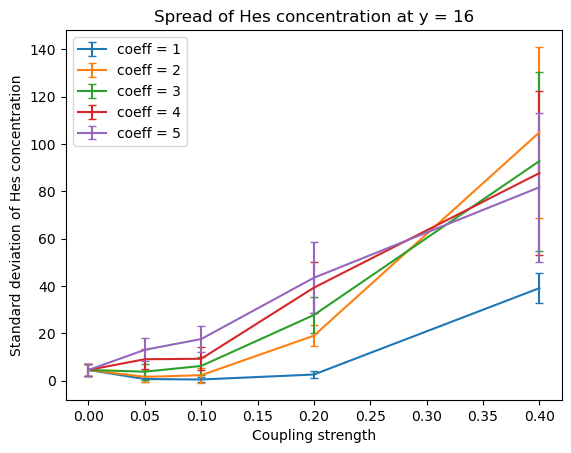

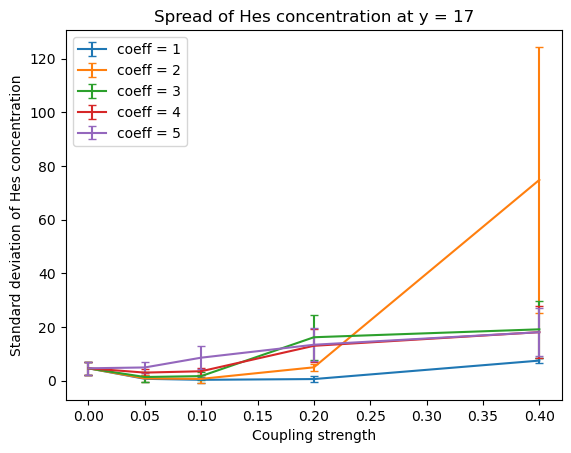

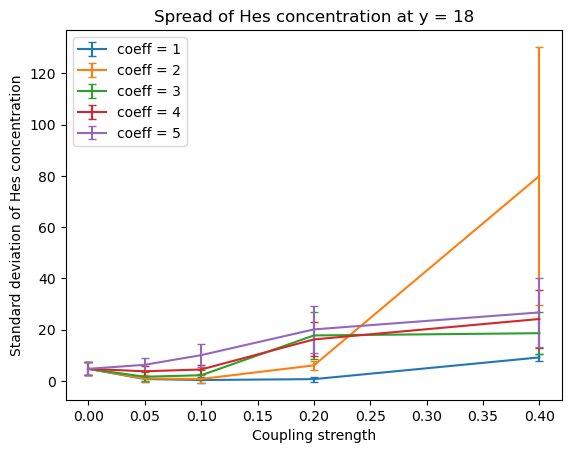

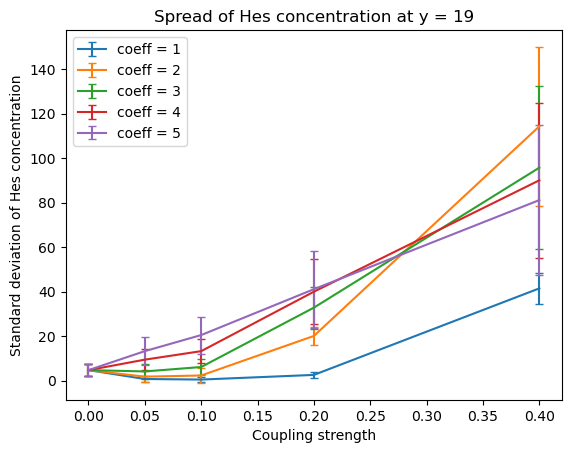

In [18]:
for p in range(lattice.P):    
    P_of_interest = p

    standard_deviation = np.zeros([len(coefficients), len(coupling_strengths), num_tsteps])
    mean = np.zeros([len(coefficients), len(coupling_strengths), num_tsteps])


    for i in range(len(coefficients)):
        for j in range(len(coupling_strengths)):
            values = results[i, j, :, :, :]
            for k in range(num_tsteps):
                standard_deviation[i,j,k] = np.std(values[k, P_of_interest, :])
                mean[i,j] = np.mean(values[k, P_of_interest, :])

    plt.figure()
    for i in range(len(coefficients)):
        plt.errorbar(coupling_strengths, np.mean(standard_deviation[i,:,500:], axis = 1), np.std(standard_deviation[i,:,500:], axis = 1), label = f'coeff = {coefficients[i]}', capsize = 3)

    plt.legend()
    plt.xlabel('Coupling strength')
    plt.ylabel('Standard deviation of Hes concentration')
    plt.title(f'Spread of Hes concentration at y = {P_of_interest}')


## Phase space diagrams

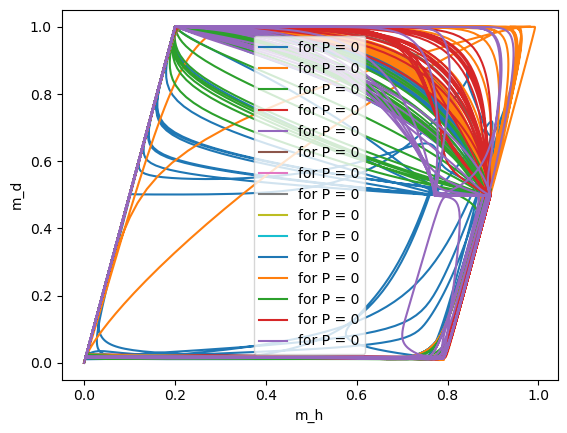

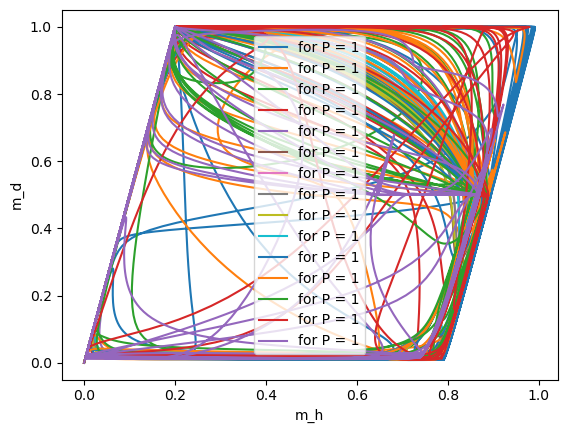

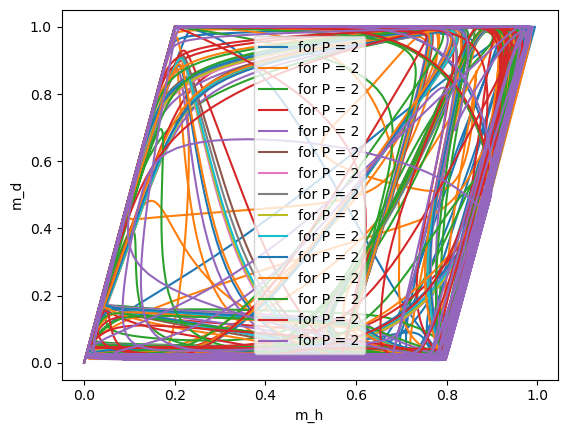

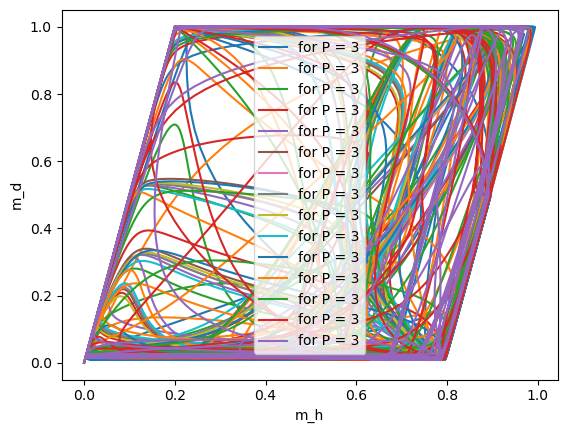

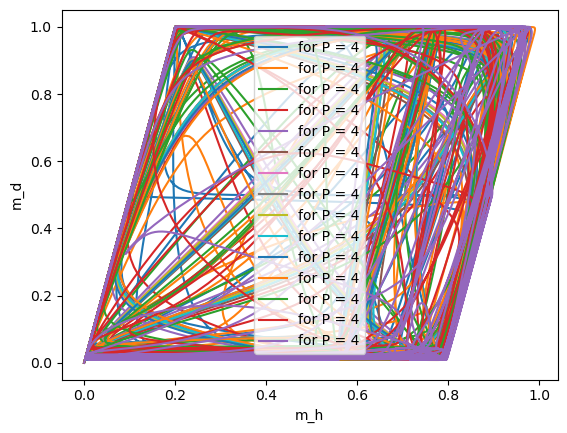

...

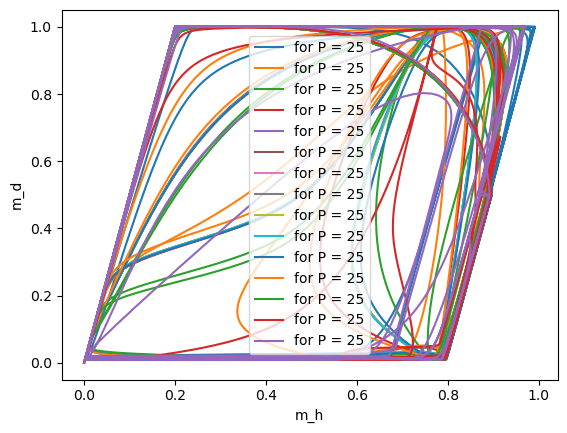

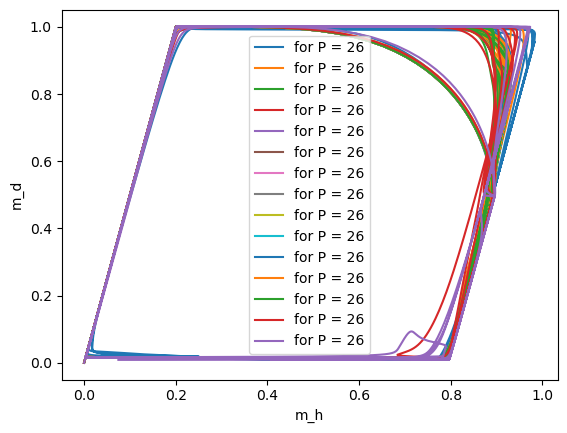

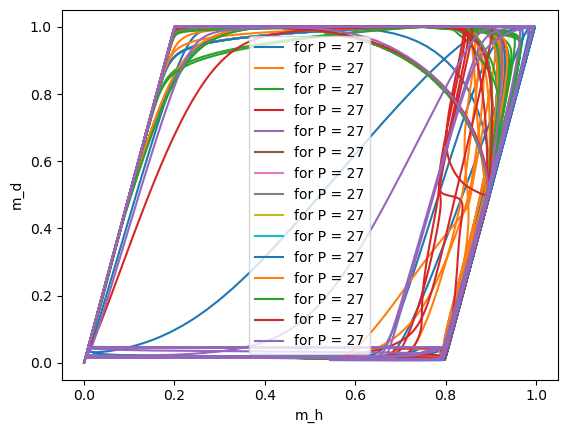

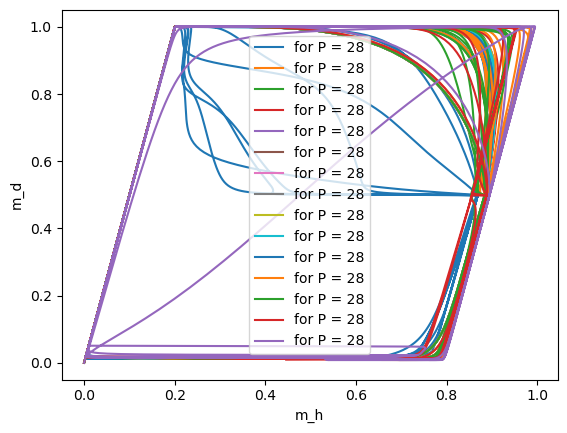

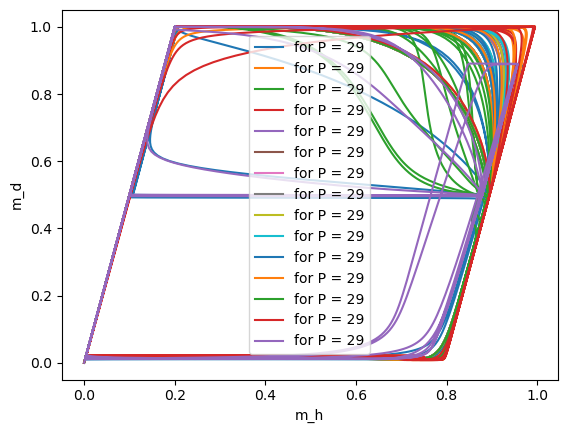

In [39]:
for i in range(lattice.P):
    plt.figure()
    for j in range(lattice.Q):
        q_test = j
        plt.plot(m_h[:,i,q_test], m_d[:,i,q_test],  label = 'for P = ' + str(i))
    plt.xlabel('m_h')
    plt.ylabel('m_d')
    plt.legend()
    plt.show()

## Results 1D

In [62]:
coeff_1D = [1, 2, 3, 4, 5]

coupling_strengths_1D = np.linspace(0, 0.4, int(0.4/0.05) + 1)
results_1D = np.zeros([len(coeff_1D), len(coupling_strengths_1D), num_tsteps, lattice.P, lattice.Q, 4])

#values for system with no Delta
print('Calculating the no coupling system')
h0, m_h0, d0, m_d0 = test_Delta_coup(coeff_1D[0], coupling_strengths_1D[i], lattice, num_tsteps, dt)

for i in range(len(coeff_1D)):
    for j in range(len(coupling_strengths_1D)):
        if j == 0:
            h, m_h, d, m_d = h0, m_h0, d0, m_d0
        else:
            h, m_h, d, m_d = test_Delta_coup(coeff_1D[i], coupling_strengths_1D[j], lattice, num_tsteps, dt)
        
        # Save the results in the 5D array
        results_1D[i,j,:,:,:,0] = h
        results_1D[i,j,:,:,:,1] = m_h
        results_1D[i,j,:,:,:,2] = d
        results_1D[i,j,:,:,:,3] = m_d


# save the results to a file\

data_dict = {
    'results_1D': results_1D,
    'coeff_1D': coeff_1D,
    'coupling_strengths_1D': coupling_strengths_1D, 
    'num_tsteps': num_tsteps,	
    'dt': dt,
    'lattice': lattice,
    'params': params,
}

with open("results_delta_15_04_1D.pkl", "wb") as file:
    pickle.dump(data_dict, file)

Calculating the no coupling system
Coefficient: 1
Coupling strength: 0.0


  1%|          | 105/9999 [00:00<00:19, 518.95it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:20<00:00, 490.78it/s]


Coefficient: 1
Coupling strength: 0.05


  0%|          | 42/9999 [00:00<00:24, 408.68it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:20<00:00, 477.85it/s]


Coefficient: 1
Coupling strength: 0.1


  0%|          | 47/9999 [00:00<00:21, 461.87it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:19<00:00, 510.50it/s]


Coefficient: 1
Coupling strength: 0.15000000000000002


  1%|          | 109/9999 [00:00<00:18, 540.07it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:19<00:00, 508.64it/s]


Coefficient: 1
Coupling strength: 0.2


  0%|          | 31/9999 [00:00<00:32, 307.82it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:18<00:00, 533.27it/s]


Coefficient: 1
Coupling strength: 0.25


  1%|          | 74/9999 [00:00<00:26, 376.29it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:19<00:00, 513.48it/s]


Coefficient: 1
Coupling strength: 0.30000000000000004


  1%|          | 70/9999 [00:00<00:28, 352.41it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:19<00:00, 525.33it/s]


Coefficient: 1
Coupling strength: 0.35000000000000003


  1%|          | 76/9999 [00:00<00:25, 382.50it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:19<00:00, 510.10it/s]


Coefficient: 1
Coupling strength: 0.4


  0%|          | 46/9999 [00:00<00:21, 456.46it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:18<00:00, 534.05it/s]


Coefficient: 2
Coupling strength: 0.05


  1%|          | 89/9999 [00:00<00:22, 444.24it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:19<00:00, 507.93it/s]


Coefficient: 2
Coupling strength: 0.1


  1%|          | 50/9999 [00:00<00:20, 496.39it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:21<00:00, 470.73it/s]


Coefficient: 2
Coupling strength: 0.15000000000000002


  1%|          | 93/9999 [00:00<00:21, 471.06it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:18<00:00, 532.07it/s]


Coefficient: 2
Coupling strength: 0.2


  0%|          | 38/9999 [00:00<00:26, 377.27it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:19<00:00, 515.33it/s]


Coefficient: 2
Coupling strength: 0.25


  0%|          | 46/9999 [00:00<00:22, 452.07it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:19<00:00, 518.96it/s]


Coefficient: 2
Coupling strength: 0.30000000000000004


  0%|          | 44/9999 [00:00<00:23, 432.39it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:19<00:00, 513.19it/s]


Coefficient: 2
Coupling strength: 0.35000000000000003


  0%|          | 26/9999 [00:00<00:39, 250.67it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:20<00:00, 492.40it/s]


Coefficient: 2
Coupling strength: 0.4


  0%|          | 39/9999 [00:00<00:26, 376.00it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:19<00:00, 503.27it/s]


Coefficient: 3
Coupling strength: 0.05


  1%|          | 80/9999 [00:00<00:24, 397.10it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:21<00:00, 473.09it/s]


Coefficient: 3
Coupling strength: 0.1


  1%|          | 53/9999 [00:00<00:19, 520.78it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:19<00:00, 503.28it/s]


Coefficient: 3
Coupling strength: 0.15000000000000002


  0%|          | 20/9999 [00:00<00:52, 189.18it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:15<00:00, 640.18it/s]


Coefficient: 3
Coupling strength: 0.2


  1%|▏         | 126/9999 [00:00<00:15, 629.87it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:14<00:00, 667.03it/s]


Coefficient: 3
Coupling strength: 0.25


  1%|          | 66/9999 [00:00<00:15, 655.20it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:14<00:00, 697.38it/s]


Coefficient: 3
Coupling strength: 0.30000000000000004


  1%|          | 63/9999 [00:00<00:15, 625.22it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:15<00:00, 657.49it/s]


Coefficient: 3
Coupling strength: 0.35000000000000003


  1%|          | 61/9999 [00:00<00:16, 605.59it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:16<00:00, 597.59it/s]


Coefficient: 3
Coupling strength: 0.4


  1%|          | 60/9999 [00:00<00:16, 595.66it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:23<00:00, 424.82it/s]


Coefficient: 4
Coupling strength: 0.05


  0%|          | 42/9999 [00:00<00:23, 416.96it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:19<00:00, 509.75it/s]


Coefficient: 4
Coupling strength: 0.1


  0%|          | 47/9999 [00:00<00:21, 457.38it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:20<00:00, 476.25it/s]


Coefficient: 4
Coupling strength: 0.15000000000000002


  0%|          | 36/9999 [00:00<00:28, 353.88it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:19<00:00, 502.06it/s]


Coefficient: 4
Coupling strength: 0.2


  1%|          | 72/9999 [00:00<00:26, 371.34it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:18<00:00, 546.43it/s]


Coefficient: 4
Coupling strength: 0.25


  0%|          | 49/9999 [00:00<00:20, 486.28it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:19<00:00, 511.26it/s]


Coefficient: 4
Coupling strength: 0.30000000000000004


  1%|          | 108/9999 [00:00<00:18, 524.76it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:19<00:00, 519.37it/s]


Coefficient: 4
Coupling strength: 0.35000000000000003


  0%|          | 44/9999 [00:00<00:22, 436.67it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:18<00:00, 533.34it/s]


Coefficient: 4
Coupling strength: 0.4


  0%|          | 45/9999 [00:00<00:22, 446.60it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:18<00:00, 532.04it/s]


Coefficient: 5
Coupling strength: 0.05


  0%|          | 41/9999 [00:00<00:24, 403.05it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:20<00:00, 480.61it/s]


Coefficient: 5
Coupling strength: 0.1


  0%|          | 32/9999 [00:00<00:31, 314.56it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:19<00:00, 520.34it/s]


Coefficient: 5
Coupling strength: 0.15000000000000002


  1%|          | 84/9999 [00:00<00:23, 422.30it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:18<00:00, 540.38it/s]


Coefficient: 5
Coupling strength: 0.2


  0%|          | 43/9999 [00:00<00:23, 422.55it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:21<00:00, 471.96it/s]


Coefficient: 5
Coupling strength: 0.25


  0%|          | 38/9999 [00:00<00:26, 377.10it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:20<00:00, 481.30it/s]


Coefficient: 5
Coupling strength: 0.30000000000000004


  0%|          | 40/9999 [00:00<00:25, 385.56it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:20<00:00, 482.56it/s]


Coefficient: 5
Coupling strength: 0.35000000000000003


  0%|          | 32/9999 [00:00<00:31, 317.59it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:21<00:00, 456.05it/s]


Coefficient: 5
Coupling strength: 0.4


  0%|          | 32/9999 [00:00<00:31, 317.68it/s]

T_h_steps: [100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119]
T_coup_steps: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


100%|██████████| 9999/9999 [00:19<00:00, 515.33it/s]


C:\Users\kbmcd\AppData\Local\Temp\ipykernel_20300\3572850055.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(6,3), constrained_layout=True)


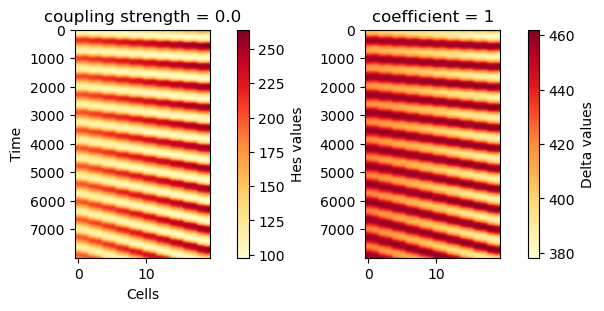

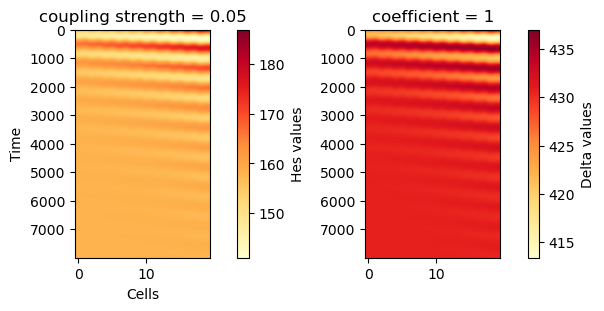

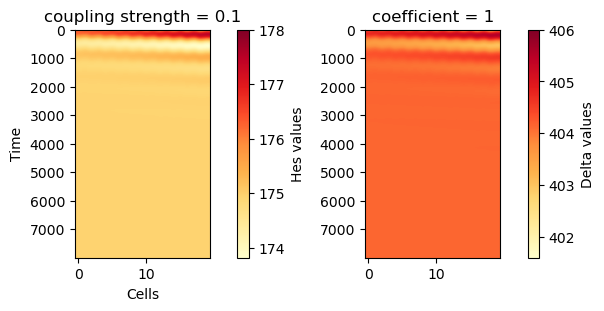

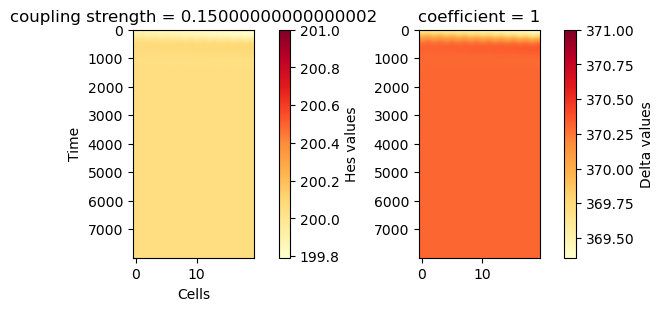

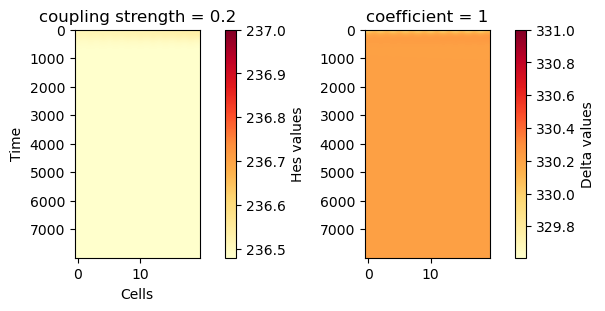

...

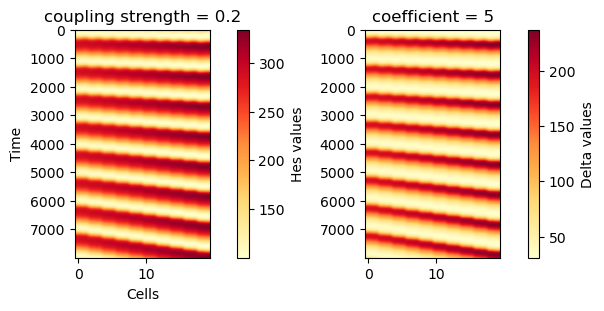

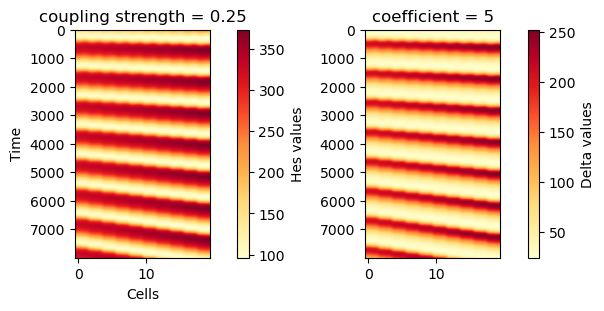

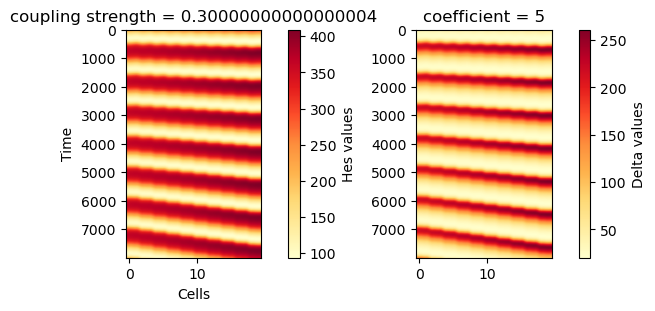

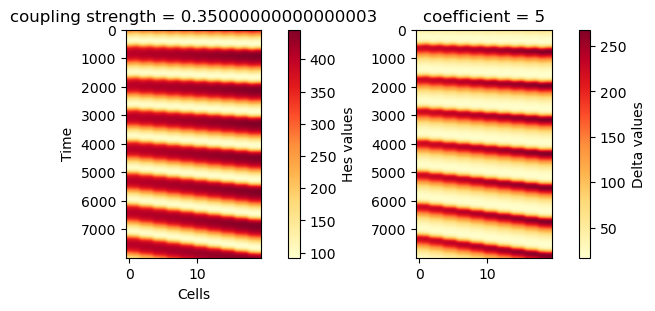

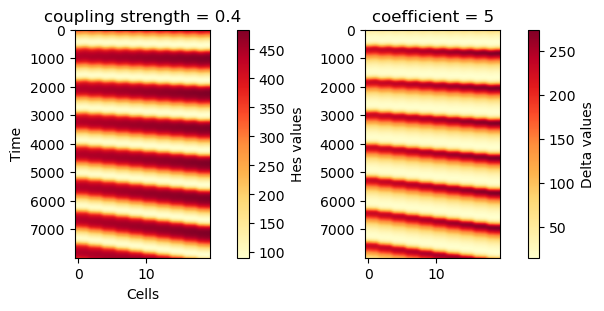

In [95]:
# Set up the figure and two axes for vertically stacked images
for i in range(len(coeff_1D)):
    for j in range(len(coupling_strengths_1D)):

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(6,3), constrained_layout=True)
        h_flat = results_1D[i,j,2000:,:,0,0].reshape(num_tsteps-2000, lattice.P)
        d_flat = results_1D[i,j,2000:,:,0,2].reshape(num_tsteps-2000, lattice.P)

        # Plot the first image
        im1 = ax1.imshow(h_flat, aspect = 'auto',  cmap='YlOrRd', vmin = np.min(h_flat), vmax = np.ceil(np.max(h_flat)))
        ax1.set_ylabel('Time')
        ax1.set_xlabel('Cells')
        ax1.set_title('coupling strength = ' + str(coupling_strengths_1D[j]))

        # Add colorbar for the first image
        cbar1 = fig.colorbar(im1, ax=ax1, orientation='vertical', fraction=0.1, pad=0.2)
        cbar1.set_label('Hes values')

        # Plot the second image
        im2 = ax2.imshow(d_flat, aspect = 'auto',  cmap='YlOrRd', vmin = np.min(d_flat), vmax = np.ceil(np.max(d_flat)))
        ax2.set_title('coefficient = ' + str(coeff_1D[i]))

        # Add colorbar for the second image
        cbar2 = fig.colorbar(im2, ax=ax2, orientation='vertical', fraction=0.1, pad=0.2)
        cbar2.set_label('Delta values')

        fig.savefig('1D_h_d_coeff_' + str(coeff_1D[i]) + '_coup_' + str(coupling_strengths_1D[j]) + '.png', dpi=300, bbox_inches='tight')

In [142]:
#results_1D = np.zeros([len(coeff_1D), len(coupling_strengths_1D), num_tsteps, lattice.P, lattice.Q, 4])
from scipy.signal import find_peaks, correlate

def smoothen_signal(signal, window_size=5):
    """
    Smoothen a 1D signal using a moving average filter.

    Parameters:
    - signal: 1D numpy array of the signal values
    - window_size: Size of the moving window (default is 5)

    Returns:
    - smoothed_signal: Smoothed signal (1D numpy array)
    """
    if window_size < 1:
        raise ValueError("Window size must be at least 1.")
    
    # Create the moving average filter
    kernel = np.ones(window_size) / window_size
    smoothed_signal = np.convolve(signal, kernel, mode='same')

    return smoothed_signal

def estimate_period_from_peaks(signal, time=None, height=None, distance=None, prominence=None):
    """
    Estimate the period of an oscillating signal using peak detection.

    Parameters:
    - signal: 1D numpy array of the signal values
    - time: Optional 1D array of time values (same length as signal). If None, assume uniform time steps.
    - height, distance, prominence: Optional arguments passed to find_peaks for filtering.

    Returns:
    - period: Estimated average period (float)
    - peak_times: Time values of the detected peaks
    """
    # Find peaks
    peaks, _ = find_peaks(signal, height=height, distance=distance, prominence=prominence)
    if time is None:
        # Assume uniform spacing
        time = np.arange(len(signal))

    peak_times = time[peaks]

    if len(peak_times) < 4:
        period = -1000  # Not enough peaks to estimate period

    # Calculate differences between consecutive peaks
    peak_diffs = np.diff(peak_times)
    period = np.mean(peak_diffs)

    return period, peak_times

def estimate_period_fft(signal, time=None, detrend=False):
    """
    Estimate the dominant period of a signal using Fourier Transform.

    Parameters:
    - signal: 1D array of signal values
    - time: 1D array of time values (if None, assume uniform time steps)
    - detrend: Remove the mean before FFT to reduce DC offset

    Returns:
    - period: Estimated dominant period
    - freqs: Frequencies used
    - power: Power spectrum
    """
    if time is None:
        dt = 1.0  # assume uniform spacing of 1
        time = np.arange(len(signal))
    else:
        dt = np.mean(np.diff(time))  # average time step

    if detrend:
        signal = signal - np.mean(signal)  # remove DC component

    # Perform FFT
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(len(signal), d=dt)

    # Use only positive frequencies
    pos_mask = fft_freqs > 0
    freqs = fft_freqs[pos_mask]
    power = np.abs(fft_vals[pos_mask])**2

    # Find the peak frequency
    peak_idx = np.argmax(power)
    dominant_freq = freqs[peak_idx]
    period = 1 / dominant_freq

    return period, freqs, power

def estimate_period_autocorr(signal, time=None, detrend=False, height = None, min_period=1):
    """
    Estimate the dominant period of a signal using autocorrelation.

    Parameters:
    - signal: 1D array of the signal values
    - time: 1D array of time points (optional, required for real period values)
    - detrend: Whether to subtract the mean (removes DC offset)
    - min_period: Minimum time (or index) to consider between peaks

    Returns:
    - estimated_period: Dominant period (in time units if time is provided)
    - lags: Lag values
    - autocorr: Autocorrelation values
    """
    n = len(signal)

    if detrend:
        signal = signal - np.mean(signal)

    # Full autocorrelation, symmetric around center
    autocorr_full = correlate(signal, signal, mode='full')
    autocorr = autocorr_full[n-1:]  # second half only
    autocorr /= autocorr[0]  # normalize

    lags = np.arange(len(autocorr))

    # Find peaks in autocorrelation
    peaks, _ = find_peaks(autocorr, distance=min_period, height=height)

    if len(peaks) < 1:
        return None, lags, autocorr  # No peaks found

    dominant_lag = peaks[0]

    if time is not None:
        dt = np.mean(np.diff(time))
        estimated_period = dominant_lag * dt
    else:
        estimated_period = dominant_lag  # in sample units

    return estimated_period, lags, autocorr

# find periods for the 1D system, per cell 
periods_peaks = np.zeros([len(coeff_1D), len(coupling_strengths_1D), lattice.P])
periods_fft = np.zeros([len(coeff_1D), len(coupling_strengths_1D), lattice.P])
periods_autocorr = np.zeros([len(coeff_1D), len(coupling_strengths_1D), lattice.P])

for i in range(len(coeff_1D)):
    for j in range(len(coupling_strengths_1D)):
        for p in range(lattice.P):
            # analyse second half of signal 
            time_analysis = int(num_tsteps/2)
            signal = results_1D[i,j,time_analysis:,p,0,0].flatten()
            signal_max = np.max(signal)
            signal_min = np.min(signal)
            amplitude_threshold = 20

            # find the period of the oscillation for each cell
            periods_peaks[i,j,p]= estimate_period_from_peaks(signal, time = np.arange(int(num_tsteps/2))*dt, height=amplitude_threshold)[0]
            periods_fft[i,j,p] = estimate_period_fft(signal, time = np.arange(int(num_tsteps/2))*dt)[0]
            periods_autocorr[i,j,p] = estimate_period_autocorr(signal, time = np.arange(int(num_tsteps/2))*dt, height=None)[0]


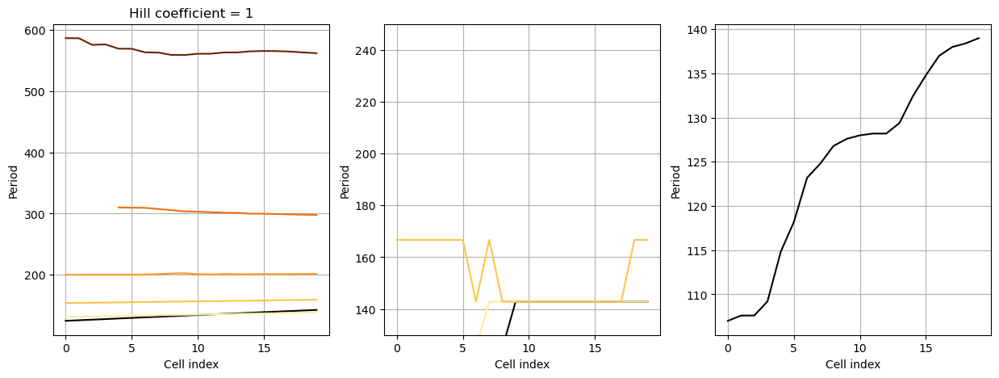

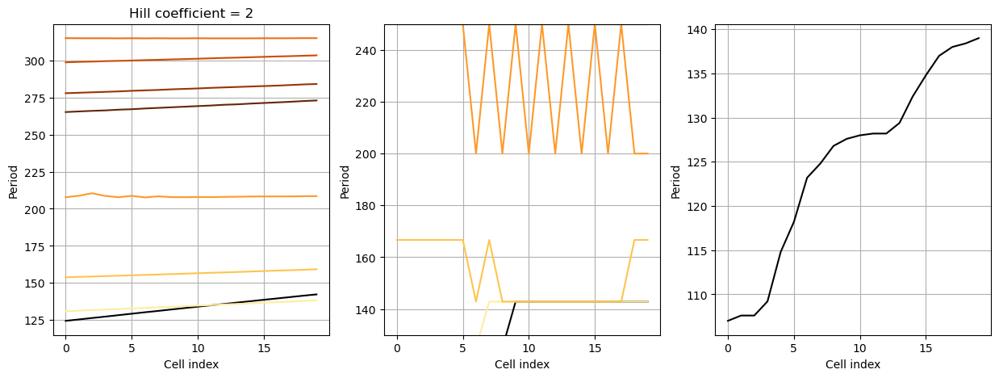

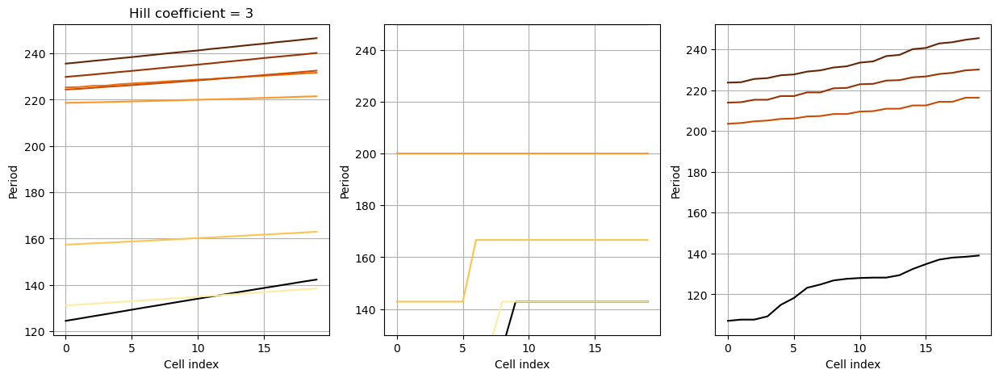

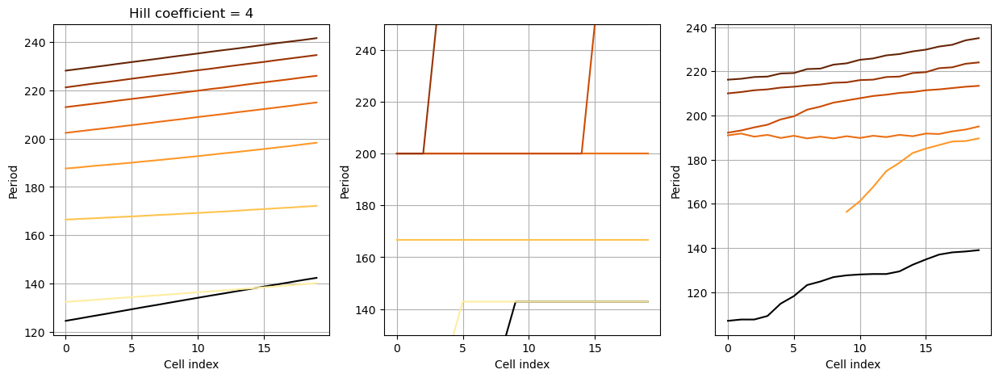

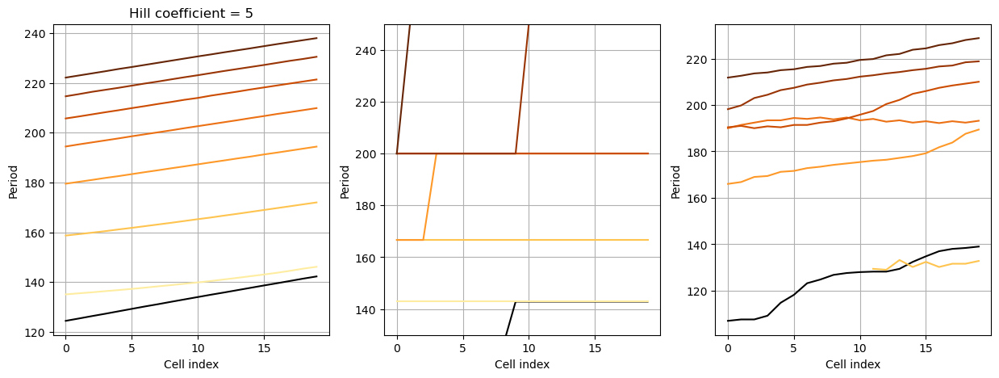

In [143]:
colors_coeffs = ['#ffffb2', '#fecc5c', '#fd8d3c', '#f03b20', '#bd0026']
colors_strengths = ['#feeda0', '#fec44f', '#fe9929', '#ec7014', '#cc4c02', '#993404', '#662506']


for i in range(len(coeff_1D)):
    plt.figure(figsize=(15,5))
    plt.subplot(1, 3, 1)
    plt.plot(np.arange(lattice.P), periods_peaks[0,0,:], label = 'no coupling periods', color = 'black')
    plt.xlabel('Cell index')
    plt.ylabel('Period')
    plt.grid()
    
    for j in range(1, len(coupling_strengths_1D)-1):
        plt.plot(np.arange(lattice.P), periods_peaks[i,j,:], color = colors_strengths[j-1], label = f'coeff = {coeff_1D[i]}, coup_strength = {coupling_strengths_1D[j]}')
    plt.title(f'Hill coefficient = {coeff_1D[i]}')


    plt.subplot(1,3,2)
    plt.plot(np.arange(lattice.P), periods_fft[0,0,:], label = 'no coupling periods', color = 'black')
    for j in range(1, len(coupling_strengths_1D)-1):
        plt.plot(np.arange(lattice.P), periods_fft[i,j,:], color = colors_strengths[j-1], label = f'coeff = {coeff_1D[i]}, coup_strength = {coupling_strengths_1D[j]}')
    plt.ylim(130,250)
    plt.xlabel('Cell index')
    plt.ylabel('Period')
    plt.grid()

    plt.subplot(1,3,3)
    plt.plot(np.arange(lattice.P), periods_autocorr[0,0,:], label = 'no coupling periods', color = 'black')
    for j in range(1, len(coupling_strengths_1D)-1):
        plt.plot(np.arange(lattice.P), periods_autocorr[i,j,:], color = colors_strengths[j-1], label = f'coeff = {coeff_1D[i]}, coup_strength = {coupling_strengths_1D[j]}')

    plt.xlabel('Cell index')
    plt.ylabel('Period')
    plt.grid()

